# SSP Input Analysis: Raw vs Normalized

1. **Section 1**: Raw inputs
2. **Section 2**: Normalized inputs
3. **Section 3**: Spatial coverage

In [30]:
import numpy as np
import rasterio
from rasterio.enums import Resampling
from rasterio.warp import reproject
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import matplotlib.patches as mpatches
import geopandas as gpd

SSPS  = ['SSP1', 'SSP2', 'SSP3', 'SSP4', 'SSP5']
YEARS = [2030, 2050, 2100]

REF_PATH       = r'READY_data/inputs/2019_gdp_aligned_010.tif'
REF_POP_PATH   = r'READY_data/inputs/2020_pop_aligned_010.tif'
NORM_DIR       = r'READY_data/inputs_normalized/ssp'
NORM_GDP_TRAIN = r'READY_data/inputs_normalized/2019_gdp_aligned_010_normalized.tif'
NORM_POP_TRAIN = r'READY_data/inputs_normalized/2020_pop_aligned_010_normalized.tif'
GDP_SSP_RAW    = r'READY_data/GDP SSP/GDP{year}_ssp{n}.tif'
POP_SSP_RAW    = r'READY_data/{ssp}/{ssp}_{year}_EU_UK_POP_01.tif'
CISI_PATH      = r'READY_data/labels/2024_CISI_010deg_nearest.tif'
SHP_PATH       = r'ne_10m_admin_0_countries/ne_10m_admin_0_countries.shp'

with rasterio.open(REF_PATH) as ref:
    ref_shape     = (ref.height, ref.width)
    ref_transform = ref.transform
    ref_crs       = ref.crs
    ref_bounds    = ref.bounds

ext = [ref_bounds.left, ref_bounds.right, ref_bounds.bottom, ref_bounds.top]
world = gpd.read_file(SHP_PATH)

def load_ref(path):
    with rasterio.open(path) as src:
        d = src.read(1).astype(np.float32)
    d[d < -1e10] = np.nan; d[np.isinf(d)] = np.nan; d[d < 0] = np.nan
    return d

def resample_to_ref(path, method=Resampling.average):
    dst = np.full(ref_shape, np.nan, dtype=np.float32)
    with rasterio.open(path) as src:
        reproject(source=rasterio.band(src, 1), destination=dst,
                  dst_transform=ref_transform, dst_crs=ref_crs, resampling=method)
    for flag in [-3.4028235e+38, -3.402823e+38, -99999, -9999, -32768]:
        dst[np.isclose(dst, flag, rtol=1e-5)] = np.nan
    dst[dst < -1e10] = np.nan; dst[np.isinf(dst)] = np.nan; dst[dst < 0] = np.nan
    return dst

def load_norm(path):
    with rasterio.open(path) as src:
        d = src.read(1).astype(np.float32)
    d[d < -1e10] = np.nan; d[np.isinf(d)] = np.nan
    return d

COLORS  = ['#4daf4a', '#377eb8', '#ff7f00', '#984ea3', '#e41a1c']
MARKERS = ['o', 's', '^', 'D', 'v']
print('Setup done -- reference grid:', ref_shape)


Setup done -- reference grid: (485, 570)


## Section 1: Raw (non-normalized) inputs

In [31]:
gdp_train = load_ref(REF_PATH)
pop_train = load_ref(REF_POP_PATH)
print('Training GDP 2019 -- mean:', round(float(np.nanmean(gdp_train)),2), 'max:', round(float(np.nanmax(gdp_train)),2))
print('Training POP 2020 -- mean:', round(float(np.nanmean(pop_train)),2), 'max:', round(float(np.nanmax(pop_train)),2))
print('Loading raw SSP GDP (resampling global files -- takes a minute)...')
gdp_raw = {}
for year in YEARS:
    gdp_raw[year] = {}
    for i, ssp in enumerate(SSPS, 1):
        gdp_raw[year][ssp] = resample_to_ref(GDP_SSP_RAW.format(year=year, n=i), method=Resampling.average)
        v = gdp_raw[year][ssp]
        print(ssp, year, 'mean:', round(float(np.nanmean(v)),0))
print('Loading raw SSP POP...')
pop_raw = {}
for year in YEARS:
    pop_raw[year] = {}
    for ssp in SSPS:
        pop_raw[year][ssp] = resample_to_ref(POP_SSP_RAW.format(ssp=ssp, year=year), method=Resampling.sum)
print('All raw data loaded.')


Training GDP 2019 -- mean: 3.07 max: 101.49
Training POP 2020 -- mean: 6991.35 max: 3436316.25
Loading raw SSP GDP (resampling global files -- takes a minute)...
SSP1 2030 mean: 605736.0
SSP2 2030 mean: 583535.0
SSP3 2030 mean: 545601.0
SSP4 2030 mean: 586887.0
SSP5 2030 mean: 652220.0
SSP1 2050 mean: 910840.0
SSP2 2050 mean: 820040.0
SSP3 2050 mean: 635171.0
SSP4 2050 mean: 823588.0
SSP5 2050 mean: 1156252.0
SSP1 2100 mean: 1575685.0
SSP2 2100 mean: 1570614.0
SSP3 2100 mean: 752428.0
SSP4 2100 mean: 1298572.0
SSP5 2100 mean: 3408616.0
Loading raw SSP POP...
All raw data loaded.


### 1.1 Mean raw values -- training baseline as black dot

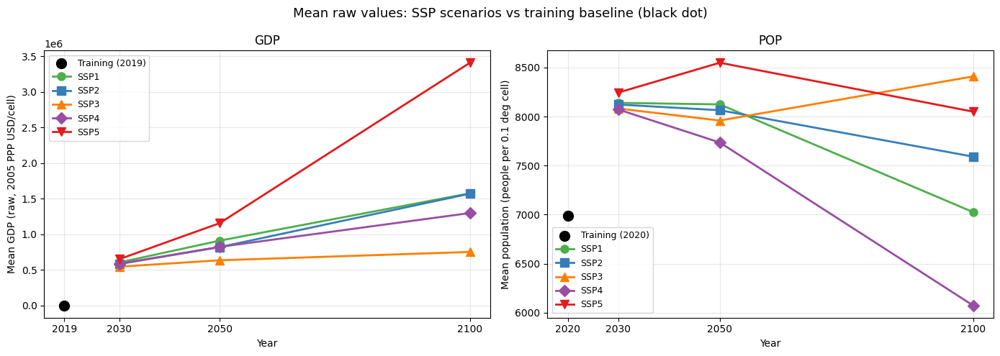

Saved raw_scenario_means.png


In [32]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle('Mean raw values: SSP scenarios vs training baseline (black dot)', fontsize=13)
spec = [
    (axes[0], 'GDP', float(np.nanmean(gdp_train)), 2019, gdp_raw, 'Mean GDP (raw, 2005 PPP USD/cell)'),
    (axes[1], 'POP', float(np.nanmean(pop_train)), 2020, pop_raw, 'Mean population (people per 0.1 deg cell)'),
]
for ax, varname, train_val, train_year, raw_dict, ylabel in spec:
    ax.scatter([train_year], [train_val], color='black', s=100, zorder=6,
               label='Training (' + str(train_year) + ')')
    for ssp, color, marker in zip(SSPS, COLORS, MARKERS):
        means = [float(np.nanmean(raw_dict[year][ssp])) for year in YEARS]
        ax.plot(YEARS, means, color=color, marker=marker, linewidth=2, markersize=8, label=ssp)
    ax.set_title(varname); ax.set_xlabel('Year'); ax.set_ylabel(ylabel)
    ax.set_xticks([train_year] + YEARS); ax.legend(fontsize=9); ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('figures/raw_scenario_means.png', dpi=150, bbox_inches='tight')
plt.show(); print('Saved raw_scenario_means.png')


### 1.2 GDP spatial maps per year

Each panel uses its own colour scale (training and SSP GDP are in different units).

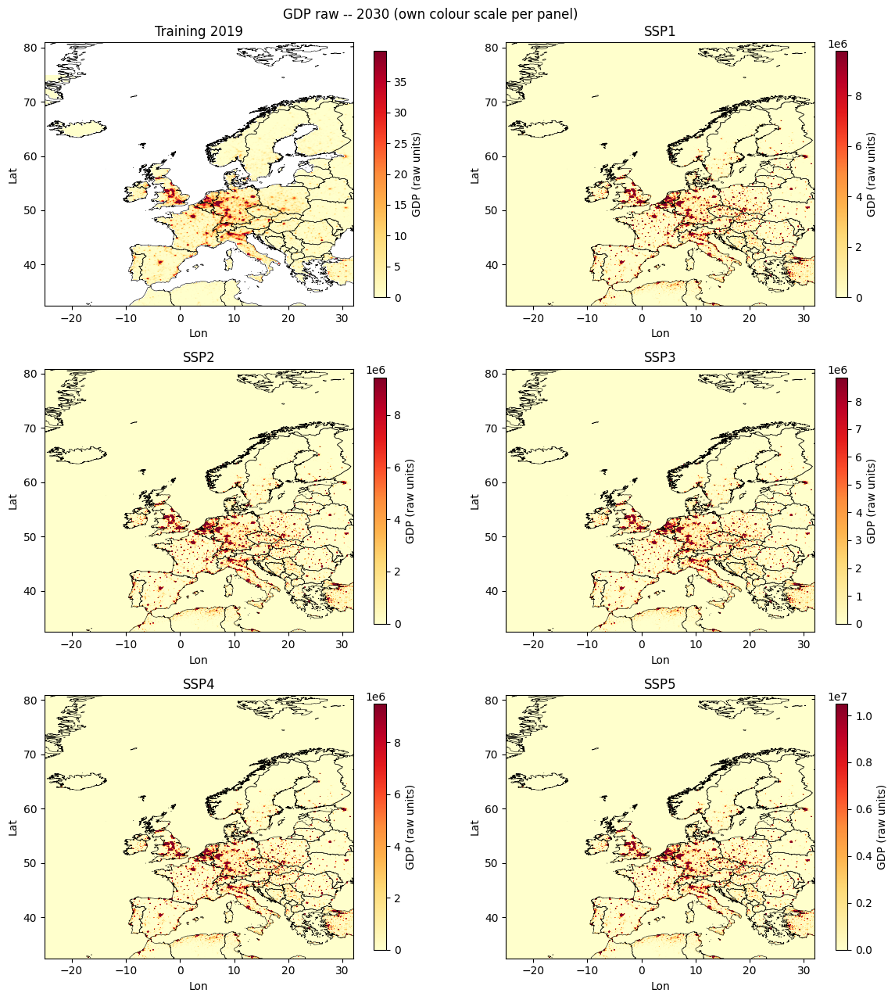

Saved raw_gdp_maps_2030.png


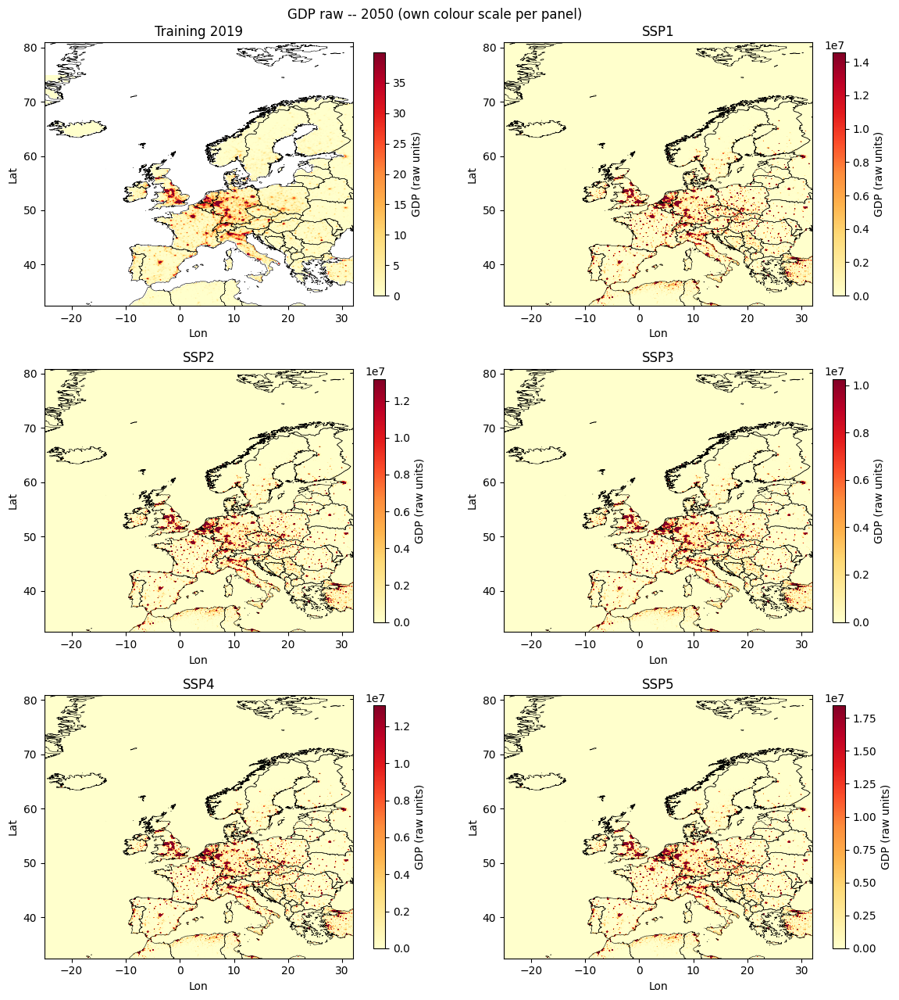

Saved raw_gdp_maps_2050.png


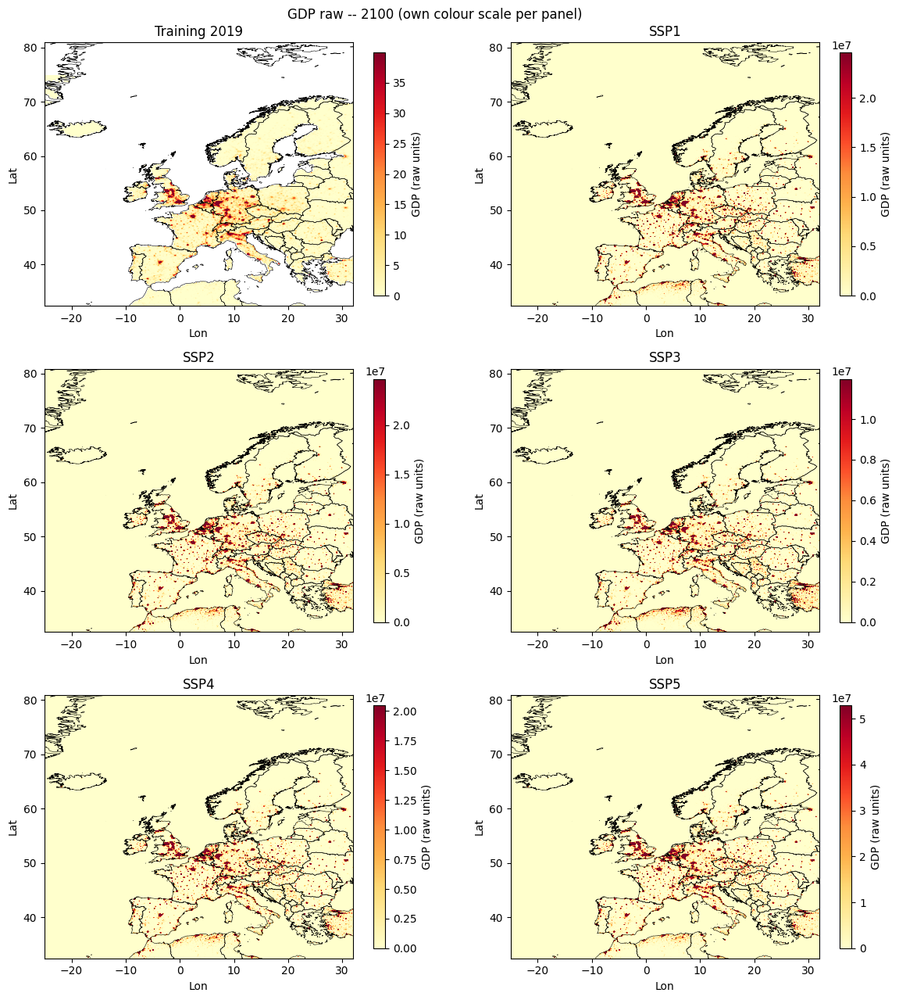

Saved raw_gdp_maps_2100.png


In [33]:
for year in YEARS:
    panels = [('Training 2019', gdp_train)] + [(ssp, gdp_raw[year][ssp]) for ssp in SSPS]
    fig, axes = plt.subplots(3, 2, figsize=(12, 13))
    fig.suptitle('GDP raw -- ' + str(year) + ' (own colour scale per panel)', fontsize=12)
    for ax, (title, data) in zip(axes.flat, panels):
        valid = data[~np.isnan(data)]
        vmax = float(np.percentile(valid, 99)) if len(valid) else 1.0
        im = ax.imshow(data, cmap='YlOrRd', vmin=0, vmax=vmax, extent=ext, origin='upper', aspect='auto')
        world.boundary.plot(ax=ax, linewidth=0.4, color='black')
        ax.set_xlim(ref_bounds.left, ref_bounds.right); ax.set_ylim(ref_bounds.bottom, ref_bounds.top)
        ax.set_title(title); ax.set_xlabel('Lon'); ax.set_ylabel('Lat')
        plt.colorbar(im, ax=ax, fraction=0.03, label='GDP (raw units)')
    plt.tight_layout()
    plt.savefig('figures/raw_gdp_maps_' + str(year) + '.png', dpi=150, bbox_inches='tight')
    plt.show(); print('Saved raw_gdp_maps_' + str(year) + '.png')


### 1.3 Population spatial maps per year

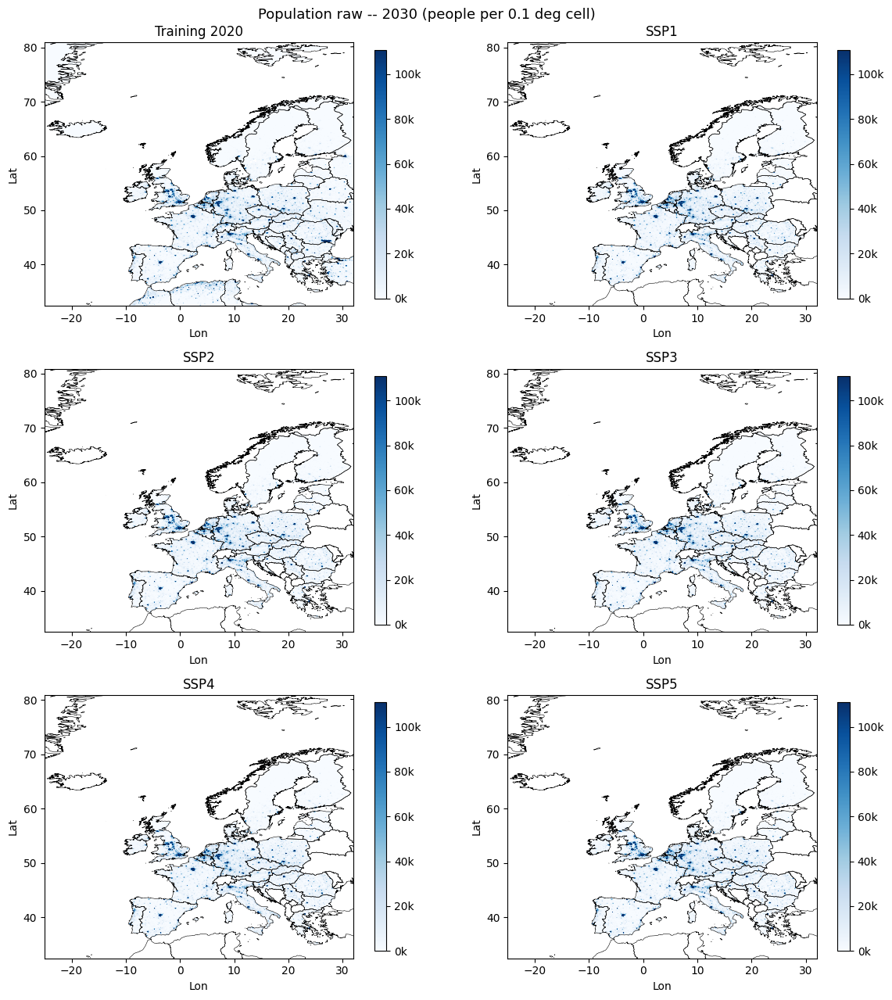

Saved raw_pop_maps_2030.png


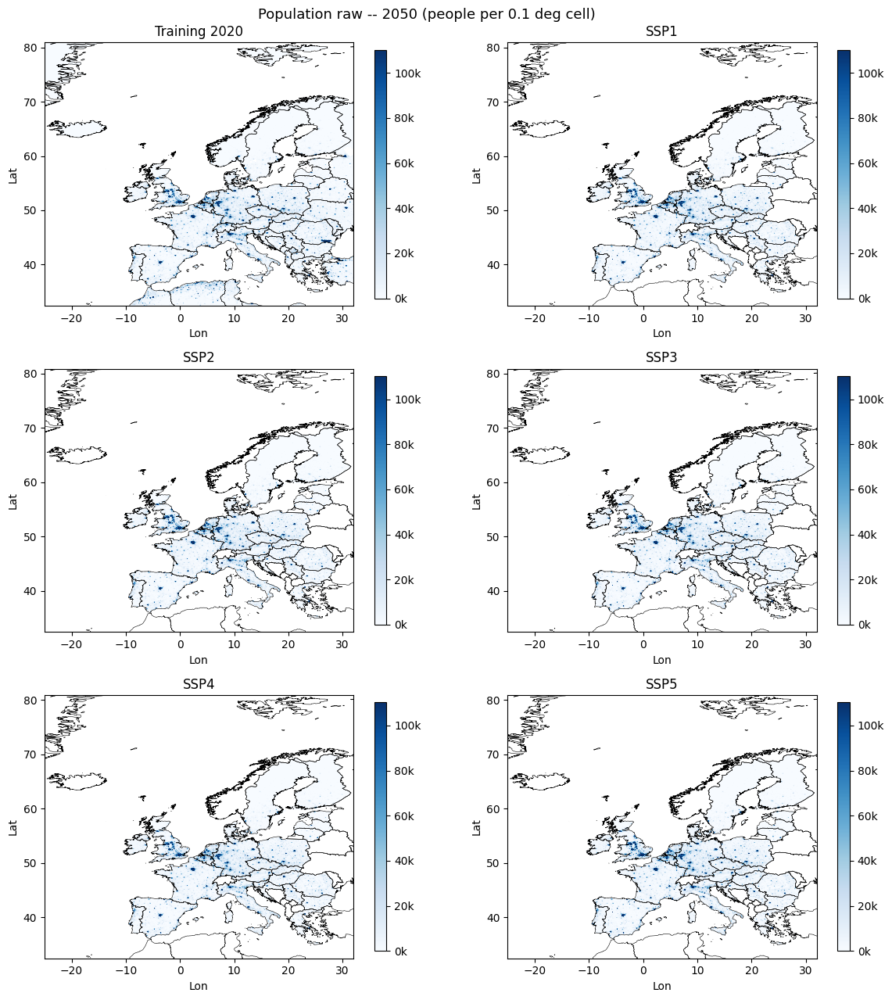

Saved raw_pop_maps_2050.png


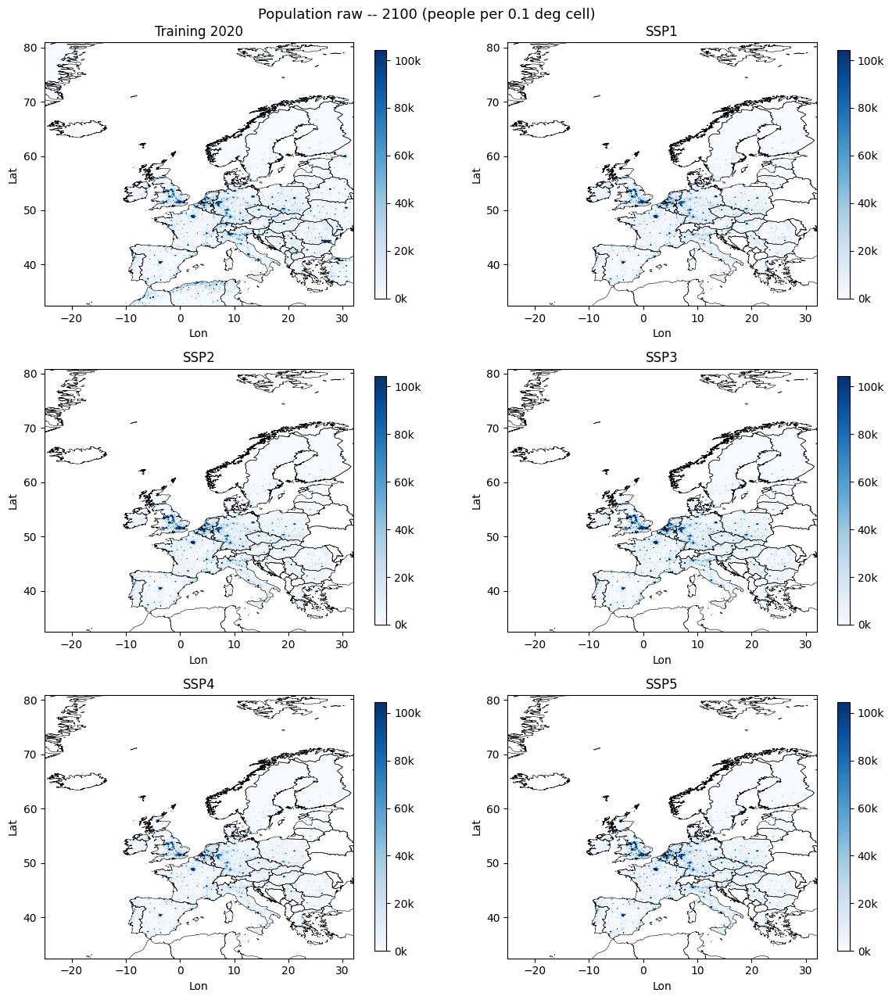

Saved raw_pop_maps_2100.png


In [34]:
for year in YEARS:
    panels = [('Training 2020', pop_train)] + [(ssp, pop_raw[year][ssp]) for ssp in SSPS]
    all_vals = np.concatenate([v[~np.isnan(v)] for _, v in panels])
    vmax = float(np.percentile(all_vals, 99))
    fig, axes = plt.subplots(3, 2, figsize=(12, 13))
    fig.suptitle('Population raw -- ' + str(year) + ' (people per 0.1 deg cell)', fontsize=13)
    for ax, (title, data) in zip(axes.flat, panels):
        im = ax.imshow(data, cmap='Blues', vmin=0, vmax=vmax, extent=ext, origin='upper', aspect='auto')
        world.boundary.plot(ax=ax, linewidth=0.4, color='black')
        ax.set_xlim(ref_bounds.left, ref_bounds.right); ax.set_ylim(ref_bounds.bottom, ref_bounds.top)
        ax.set_title(title); ax.set_xlabel('Lon'); ax.set_ylabel('Lat')
        plt.colorbar(im, ax=ax, fraction=0.03, format=mticker.FuncFormatter(lambda x, _: str(round(x/1e3)) + 'k'))
    plt.tight_layout()
    plt.savefig('figures/raw_pop_maps_' + str(year) + '.png', dpi=150, bbox_inches='tight')
    plt.show(); print('Saved raw_pop_maps_' + str(year) + '.png')


### 1.4 Raw value distributions

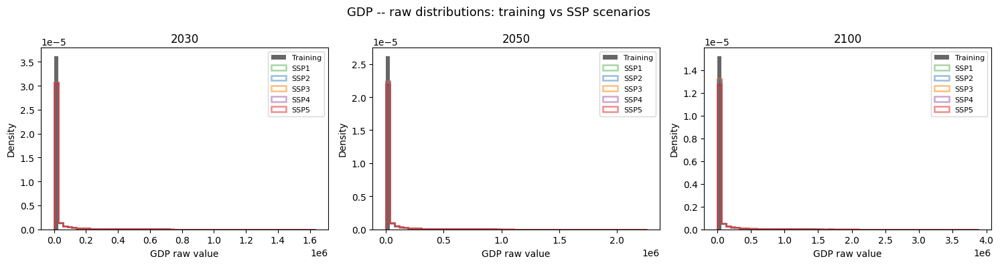

Saved raw_gdp_distributions.png


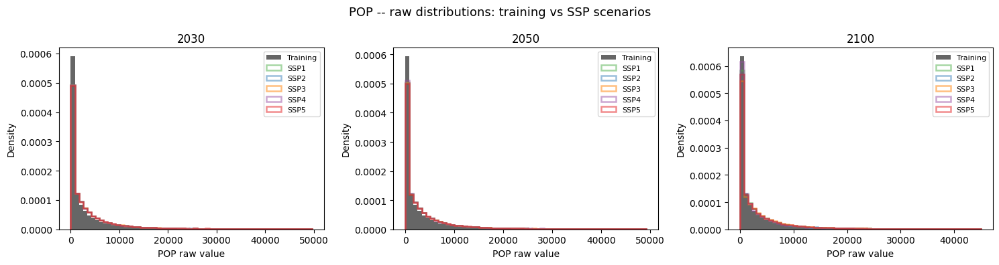

Saved raw_pop_distributions.png


In [35]:
for varname, train_data, raw_dict in [('GDP', gdp_train, gdp_raw), ('POP', pop_train, pop_raw)]:
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))
    fig.suptitle(varname + ' -- raw distributions: training vs SSP scenarios', fontsize=13)
    for ax, year in zip(axes, YEARS):
        all_valid = np.concatenate([raw_dict[year][ssp][~np.isnan(raw_dict[year][ssp])] for ssp in SSPS])
        bins = np.linspace(0, float(np.percentile(all_valid, 97)), 60)
        ax.hist(train_data[~np.isnan(train_data)], bins=bins, alpha=0.6, color='black', label='Training', density=True)
        for ssp, color in zip(SSPS, COLORS):
            d = raw_dict[year][ssp]
            ax.hist(d[~np.isnan(d)], bins=bins, alpha=0.5, color=color, label=ssp, density=True, histtype='step', linewidth=1.8)
        ax.set_title(str(year)); ax.set_xlabel(varname + ' raw value'); ax.set_ylabel('Density'); ax.legend(fontsize=8)
    plt.tight_layout()
    plt.savefig('figures/raw_' + varname.lower() + '_distributions.png', dpi=150, bbox_inches='tight')
    plt.show(); print('Saved raw_' + varname.lower() + '_distributions.png')


## Section 2: Normalized inputs

Each file normalized independently: `(log1p(x) - mean) / std`.

In [36]:
gdp_norm_train = load_norm(NORM_GDP_TRAIN)
pop_norm_train = load_norm(NORM_POP_TRAIN)
print('Norm training GDP -- mean:', round(float(np.nanmean(gdp_norm_train)),4))
print('Norm training POP -- mean:', round(float(np.nanmean(pop_norm_train)),4))
gdp_norm = {}; pop_norm = {}
for year in YEARS:
    gdp_norm[year] = {}; pop_norm[year] = {}
    for ssp in SSPS:
        gdp_norm[year][ssp] = load_norm(NORM_DIR + '/GDP_' + ssp + '_' + str(year) + '_normalized.tif')
        pop_norm[year][ssp] = load_norm(NORM_DIR + '/POP_' + ssp + '_' + str(year) + '_normalized.tif')
print('Done.')


Norm training GDP -- mean: -0.0
Norm training POP -- mean: -0.0
Done.


### 2.1 Normalized GDP maps

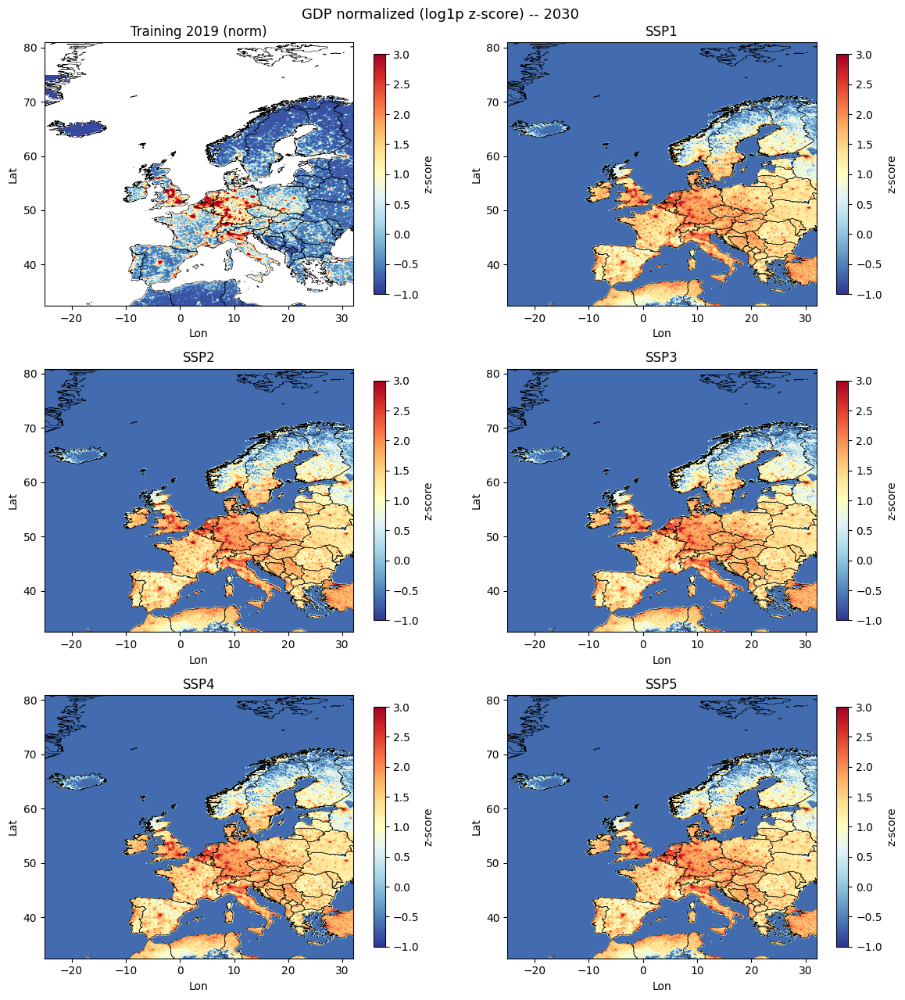

Saved norm_gdp_maps_2030.png


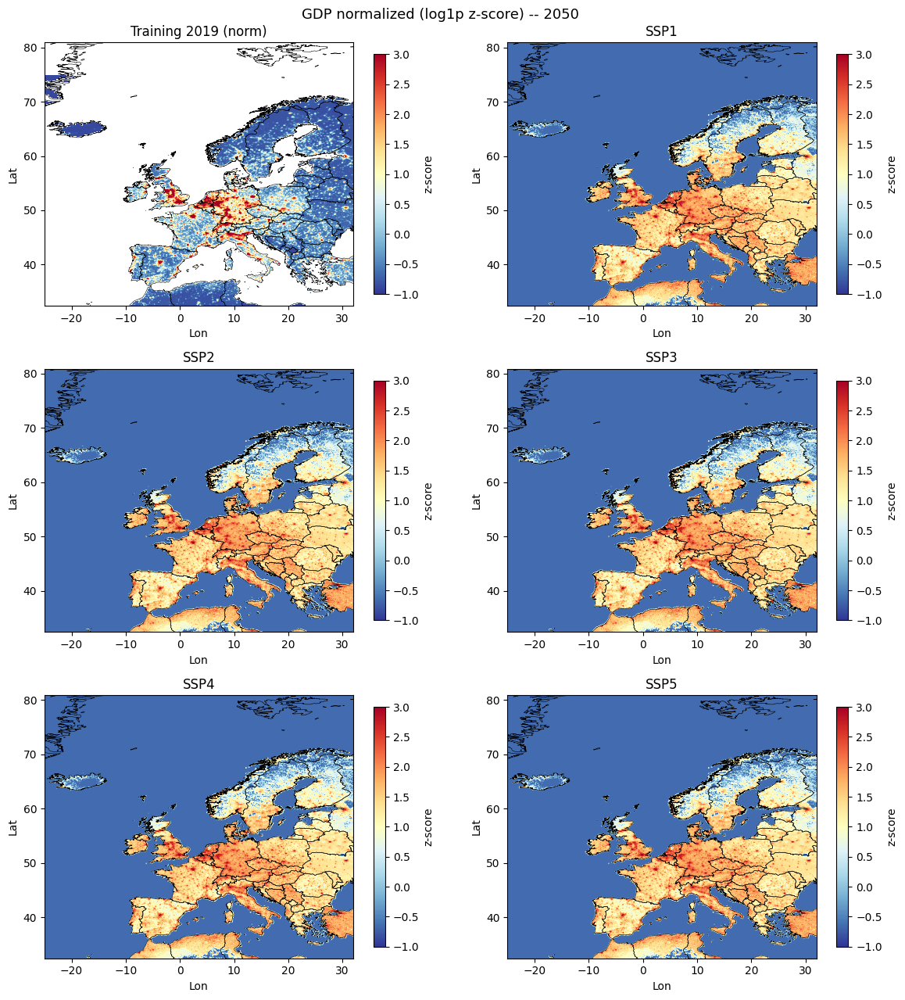

Saved norm_gdp_maps_2050.png


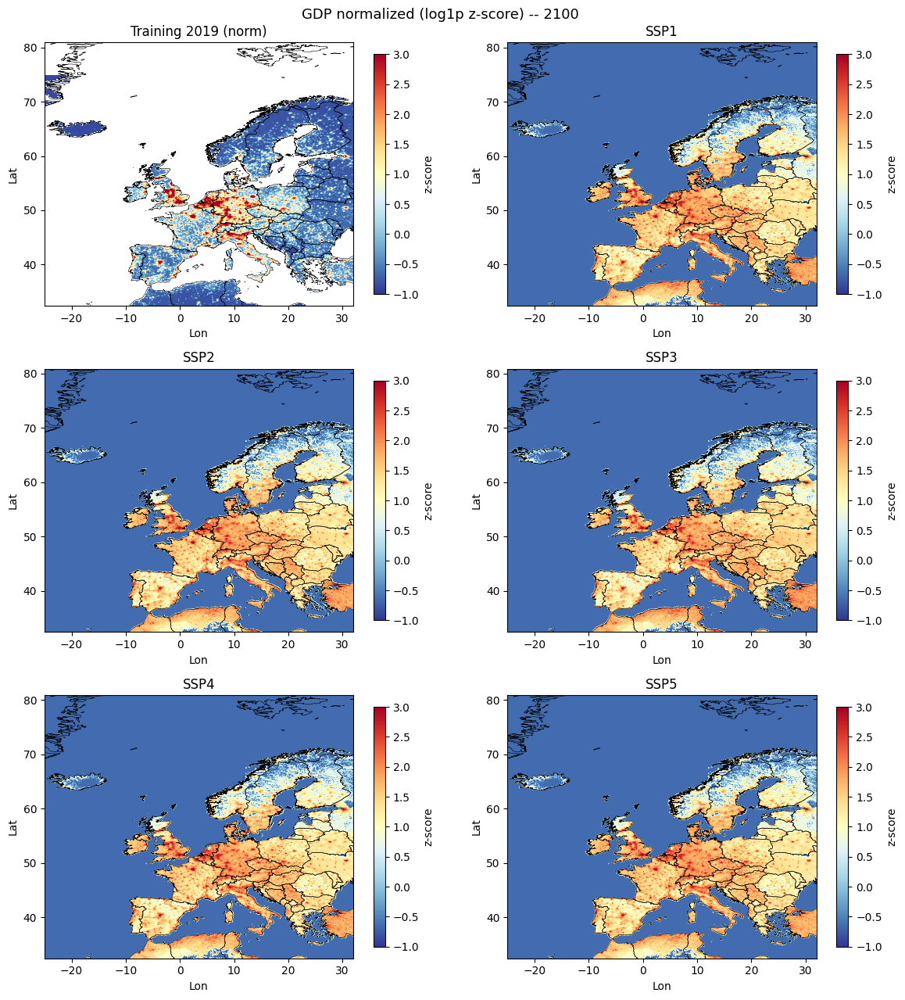

Saved norm_gdp_maps_2100.png


In [37]:
for year in YEARS:
    panels = [('Training 2019 (norm)', gdp_norm_train)] + [(ssp, gdp_norm[year][ssp]) for ssp in SSPS]
    fig, axes = plt.subplots(3, 2, figsize=(12, 13))
    fig.suptitle('GDP normalized (log1p z-score) -- ' + str(year), fontsize=13)
    for ax, (title, data) in zip(axes.flat, panels):
        im = ax.imshow(data, cmap='RdYlBu_r', vmin=-1, vmax=3, extent=ext, origin='upper', aspect='auto')
        world.boundary.plot(ax=ax, linewidth=0.4, color='black')
        ax.set_xlim(ref_bounds.left, ref_bounds.right); ax.set_ylim(ref_bounds.bottom, ref_bounds.top)
        ax.set_title(title); ax.set_xlabel('Lon'); ax.set_ylabel('Lat')
        plt.colorbar(im, ax=ax, fraction=0.03, label='z-score')
    plt.tight_layout()
    plt.savefig('figures/norm_gdp_maps_' + str(year) + '.png', dpi=150, bbox_inches='tight')
    plt.show(); print('Saved norm_gdp_maps_' + str(year) + '.png')


### 2.2 Normalized POP maps

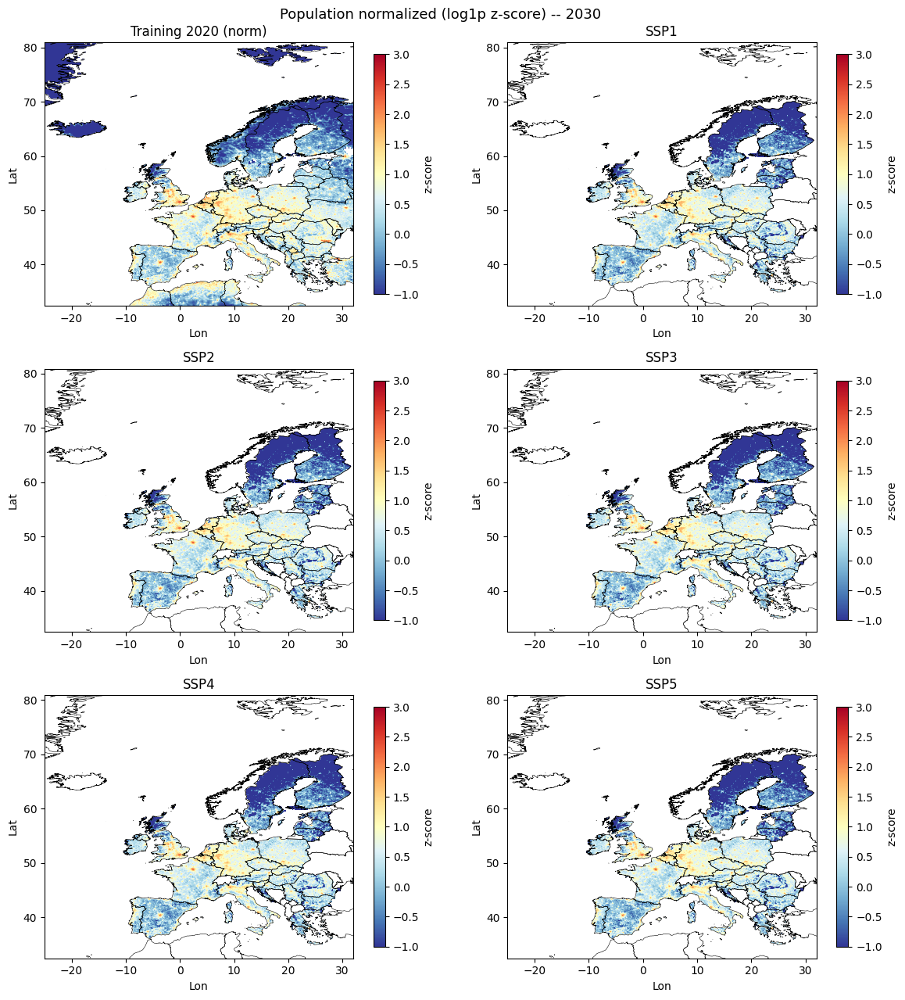

Saved norm_pop_maps_2030.png


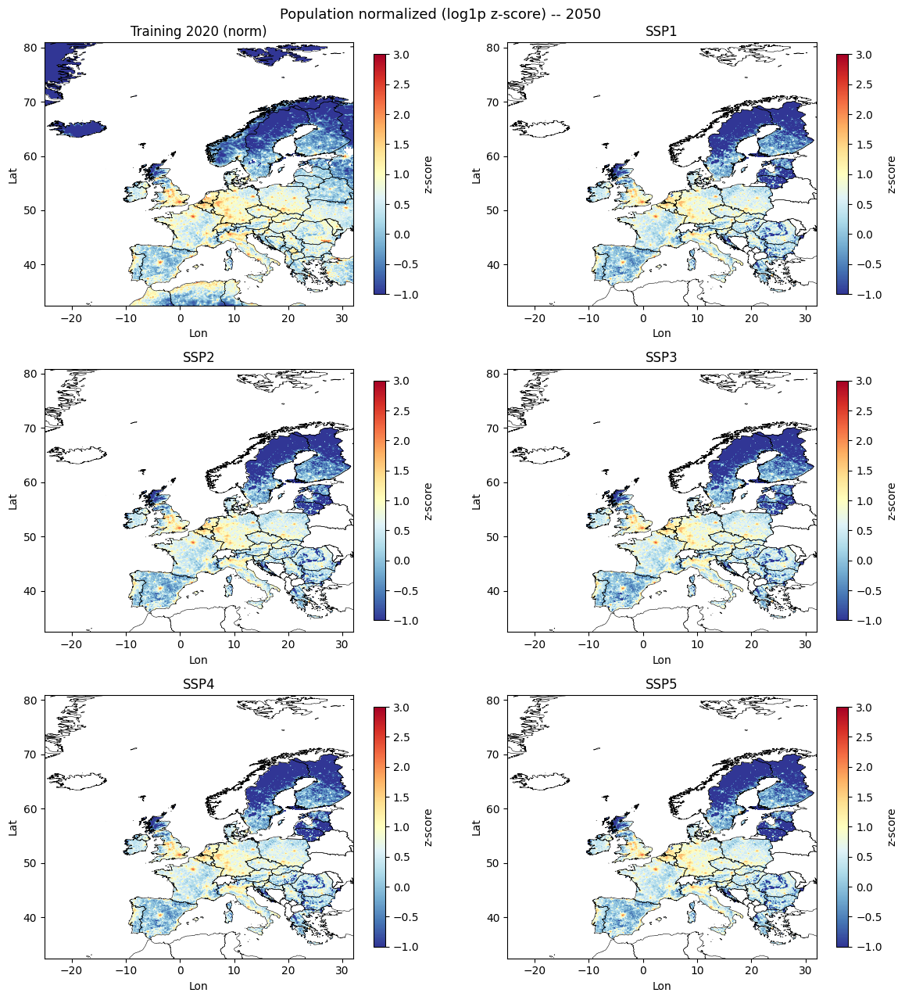

Saved norm_pop_maps_2050.png


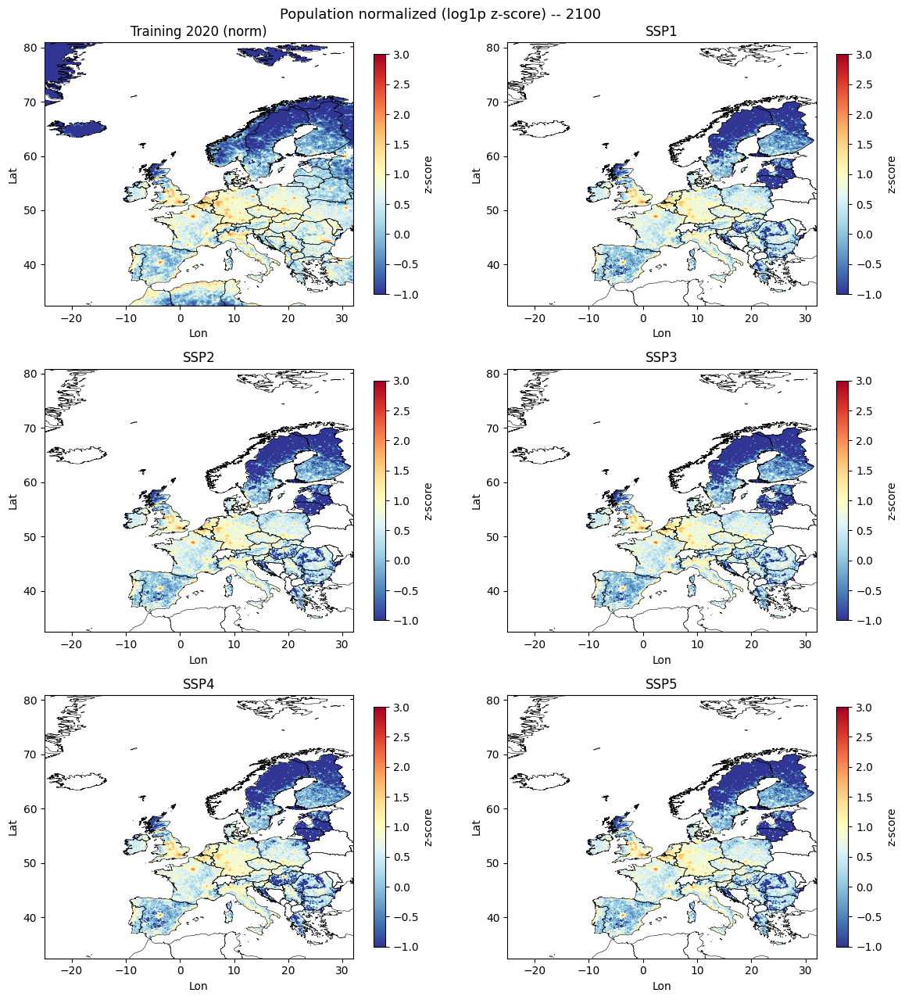

Saved norm_pop_maps_2100.png


In [38]:
for year in YEARS:
    panels = [('Training 2020 (norm)', pop_norm_train)] + [(ssp, pop_norm[year][ssp]) for ssp in SSPS]
    fig, axes = plt.subplots(3, 2, figsize=(12, 13))
    fig.suptitle('Population normalized (log1p z-score) -- ' + str(year), fontsize=13)
    for ax, (title, data) in zip(axes.flat, panels):
        im = ax.imshow(data, cmap='RdYlBu_r', vmin=-1, vmax=3, extent=ext, origin='upper', aspect='auto')
        world.boundary.plot(ax=ax, linewidth=0.4, color='black')
        ax.set_xlim(ref_bounds.left, ref_bounds.right); ax.set_ylim(ref_bounds.bottom, ref_bounds.top)
        ax.set_title(title); ax.set_xlabel('Lon'); ax.set_ylabel('Lat')
        plt.colorbar(im, ax=ax, fraction=0.03, label='z-score')
    plt.tight_layout()
    plt.savefig('figures/norm_pop_maps_' + str(year) + '.png', dpi=150, bbox_inches='tight')
    plt.show(); print('Saved norm_pop_maps_' + str(year) + '.png')


### 2.3 Normalized distributions -- scenarios collapse after normalization

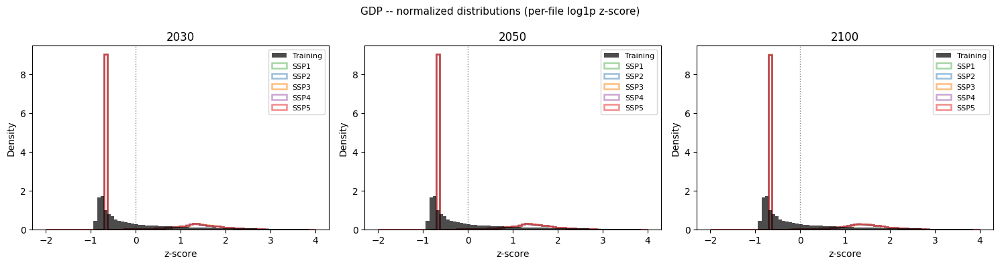

Saved norm_gdp_distributions.png


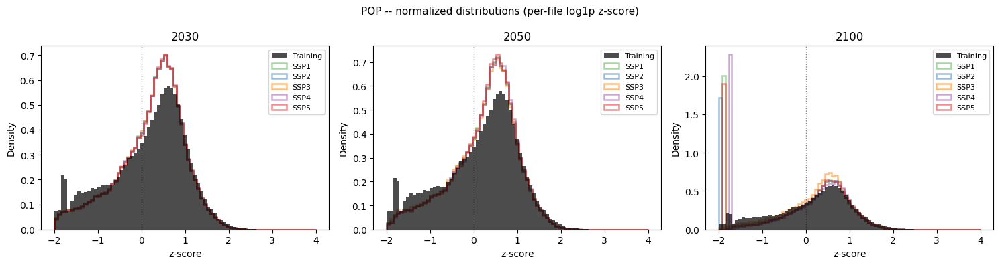

Saved norm_pop_distributions.png


In [39]:
for varname, train_norm, norm_dict in [('GDP', gdp_norm_train, gdp_norm), ('POP', pop_norm_train, pop_norm)]:
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))
    fig.suptitle(varname + ' -- normalized distributions (per-file log1p z-score)', fontsize=11)
    bins = np.linspace(-2, 4, 80)
    for ax, year in zip(axes, YEARS):
        ax.hist(train_norm[~np.isnan(train_norm)], bins=bins, alpha=0.7, color='black', label='Training', density=True, zorder=5)
        for ssp, color in zip(SSPS, COLORS):
            d = norm_dict[year][ssp]
            ax.hist(d[~np.isnan(d)], bins=bins, alpha=0.5, color=color, label=ssp, density=True, histtype='step', linewidth=1.8)
        ax.set_title(str(year)); ax.set_xlabel('z-score'); ax.set_ylabel('Density')
        ax.legend(fontsize=8); ax.axvline(0, color='gray', linestyle=':', linewidth=1)
    plt.tight_layout()
    plt.savefig('figures/norm_' + varname.lower() + '_distributions.png', dpi=150, bbox_inches='tight')
    plt.show(); print('Saved norm_' + varname.lower() + '_distributions.png')


### 2.4 Raw vs normalized means -- effect of normalization (training as black dot)

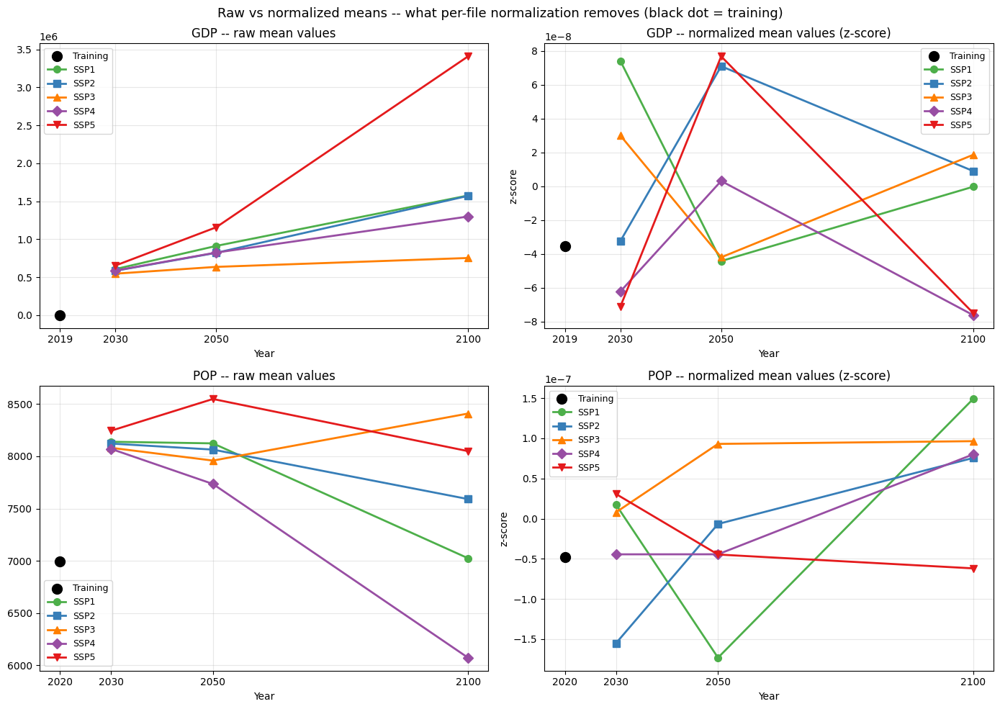

Saved raw_vs_norm_comparison.png


In [40]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
fig.suptitle('Raw vs normalized means -- what per-file normalization removes (black dot = training)', fontsize=13)
spec2 = [
    ('GDP', float(np.nanmean(gdp_train)), 2019, gdp_raw, gdp_norm, gdp_norm_train),
    ('POP', float(np.nanmean(pop_train)), 2020, pop_raw, pop_norm, pop_norm_train),
]
for row, (varname, train_val, train_year, raw_dict, norm_dict, train_norm) in enumerate(spec2):
    ax_raw  = axes[row, 0]
    ax_norm = axes[row, 1]
    ax_raw.scatter( [train_year], [train_val],                      color='black', s=100, zorder=6, label='Training')
    ax_norm.scatter([train_year], [float(np.nanmean(train_norm))],  color='black', s=100, zorder=6, label='Training')
    for ssp, color, marker in zip(SSPS, COLORS, MARKERS):
        ax_raw.plot( YEARS, [float(np.nanmean(raw_dict[y][ssp]))  for y in YEARS], color=color, marker=marker, linewidth=2, markersize=7, label=ssp)
        ax_norm.plot(YEARS, [float(np.nanmean(norm_dict[y][ssp])) for y in YEARS], color=color, marker=marker, linewidth=2, markersize=7, label=ssp)
    ax_raw.set_title(varname + ' -- raw mean values')
    ax_raw.set_xlabel('Year'); ax_raw.set_xticks([train_year] + YEARS); ax_raw.legend(fontsize=9); ax_raw.grid(True, alpha=0.3)
    ax_norm.set_title(varname + ' -- normalized mean values (z-score)')
    ax_norm.set_xlabel('Year'); ax_norm.set_ylabel('z-score'); ax_norm.set_xticks([train_year] + YEARS); ax_norm.legend(fontsize=9); ax_norm.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('figures/raw_vs_norm_comparison.png', dpi=150, bbox_inches='tight')
plt.show(); print('Saved raw_vs_norm_comparison.png')


### 2.5 Pixel-level correlation: normalized training vs each SSP

In [41]:
print('Pearson r: normalized training input vs each SSP')
print('            ' + ''.join([str(y).rjust(10) for y in YEARS]))
for varname, train_norm, norm_dict in [('GDP', gdp_norm_train, gdp_norm), ('POP', pop_norm_train, pop_norm)]:
    print('\n' + varname)
    for ssp in SSPS:
        row = '  ' + ssp
        for year in YEARS:
            s = norm_dict[year][ssp]
            mask = ~(np.isnan(train_norm) | np.isnan(s))
            r = float(np.corrcoef(train_norm[mask], s[mask])[0, 1])
            row += str(round(r, 4)).rjust(10)
        print(row)
print('\nCorrelation near 1.0 = SSP inputs indistinguishable from training after normalization')


Pearson r: normalized training input vs each SSP
                  2030      2050      2100

GDP
  SSP1    0.6631    0.6539    0.6555
  SSP2    0.6617    0.6535    0.6447
  SSP3    0.6582    0.6497    0.6232
  SSP4    0.6656    0.6616    0.6597
  SSP5    0.6618    0.6509    0.6524

POP
  SSP1    0.9445    0.9143    0.8727
  SSP2    0.9441    0.9135    0.8689
  SSP3     0.946    0.9243    0.8993
  SSP4    0.9437    0.9056    0.8515
  SSP5    0.9398    0.9021    0.8725

Correlation near 1.0 = SSP inputs indistinguishable from training after normalization


## Section 3: Spatial coverage -- which pixels does the model use?

In [42]:
with rasterio.open(CISI_PATH) as src:
    cisi_raw = src.read(1).astype(np.float32)
gdp_mask     = np.isfinite(gdp_train) & (gdp_train >= 0)
pop_mask     = np.isfinite(pop_train) & (pop_train >= 0)
cisi_mask    = np.isfinite(cisi_raw) & (cisi_raw > -1e10)
gdp_ssp_ex   = load_norm(NORM_DIR + '/GDP_SSP1_2030_normalized.tif')
pop_ssp_ex   = load_norm(NORM_DIR + '/POP_SSP1_2030_normalized.tif')
gdp_ssp_mask = np.isfinite(gdp_ssp_ex)
pop_ssp_mask = np.isfinite(pop_ssp_ex)
print('Mask coverage:')
print('  Training GDP:       ', round(gdp_mask.mean()*100, 1), '%')
print('  Training POP:       ', round(pop_mask.mean()*100, 1), '%')
print('  CISI label (= pred):', round(cisi_mask.mean()*100, 1), '%')
print('  SSP GDP normalized: ', round(gdp_ssp_mask.mean()*100, 1), '%')
print('  SSP POP normalized: ', round(pop_ssp_mask.mean()*100, 1), '%')
print('  SSP GDP outside pred:', round((gdp_ssp_mask & ~cisi_mask).mean()*100, 1), '%')
print('  SSP POP missing in pred:', round((~pop_ssp_mask & cisi_mask).mean()*100, 1), '%')


Mask coverage:
  Training GDP:        32.3 %
  Training POP:        38.0 %
  CISI label (= pred): 31.6 %
  SSP GDP normalized:  100.0 %
  SSP POP normalized:  23.1 %
  SSP GDP outside pred: 68.4 %
  SSP POP missing in pred: 9.1 %


### 3.1 Mask comparison map

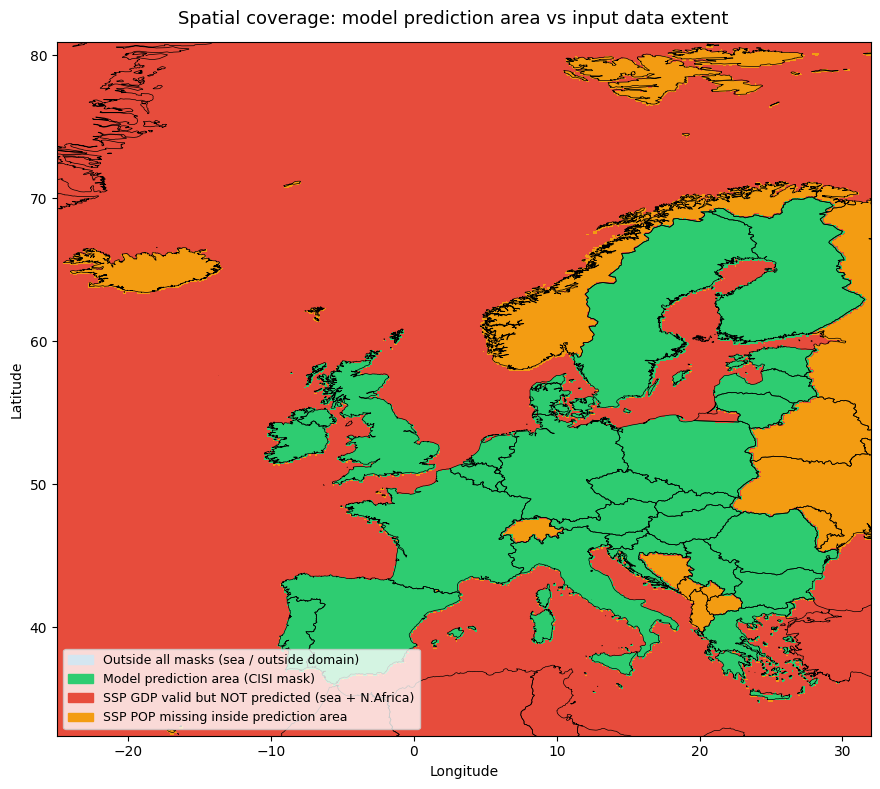

Saved spatial_coverage_masks.png


In [43]:
coverage = np.zeros(ref_shape, dtype=np.float32)
coverage[gdp_ssp_mask & ~cisi_mask] = 2
coverage[cisi_mask]                  = 1
coverage[~pop_ssp_mask & cisi_mask]  = 3
fig, ax = plt.subplots(1, 1, figsize=(10, 8))
fig.suptitle('Spatial coverage: model prediction area vs input data extent', fontsize=13)
cmap_cov = plt.matplotlib.colors.ListedColormap(['#d4e6f1', '#2ecc71', '#e74c3c', '#f39c12'])
bnorm    = plt.matplotlib.colors.BoundaryNorm([-0.5, 0.5, 1.5, 2.5, 3.5], cmap_cov.N)
ax.imshow(coverage, cmap=cmap_cov, norm=bnorm, extent=ext, origin='upper', aspect='auto')
world.boundary.plot(ax=ax, linewidth=0.5, color='black')
ax.set_xlim(ref_bounds.left, ref_bounds.right); ax.set_ylim(ref_bounds.bottom, ref_bounds.top)
ax.set_xlabel('Longitude'); ax.set_ylabel('Latitude')
legend = [
    mpatches.Patch(color='#d4e6f1', label='Outside all masks (sea / outside domain)'),
    mpatches.Patch(color='#2ecc71', label='Model prediction area (CISI mask)'),
    mpatches.Patch(color='#e74c3c', label='SSP GDP valid but NOT predicted (sea + N.Africa)'),
    mpatches.Patch(color='#f39c12', label='SSP POP missing inside prediction area'),
]
ax.legend(handles=legend, loc='lower left', fontsize=9)
plt.tight_layout()
plt.savefig('figures/spatial_coverage_masks.png', dpi=150, bbox_inches='tight')
plt.show(); print('Saved spatial_coverage_masks.png')


### 3.2 Individual masks side-by-side

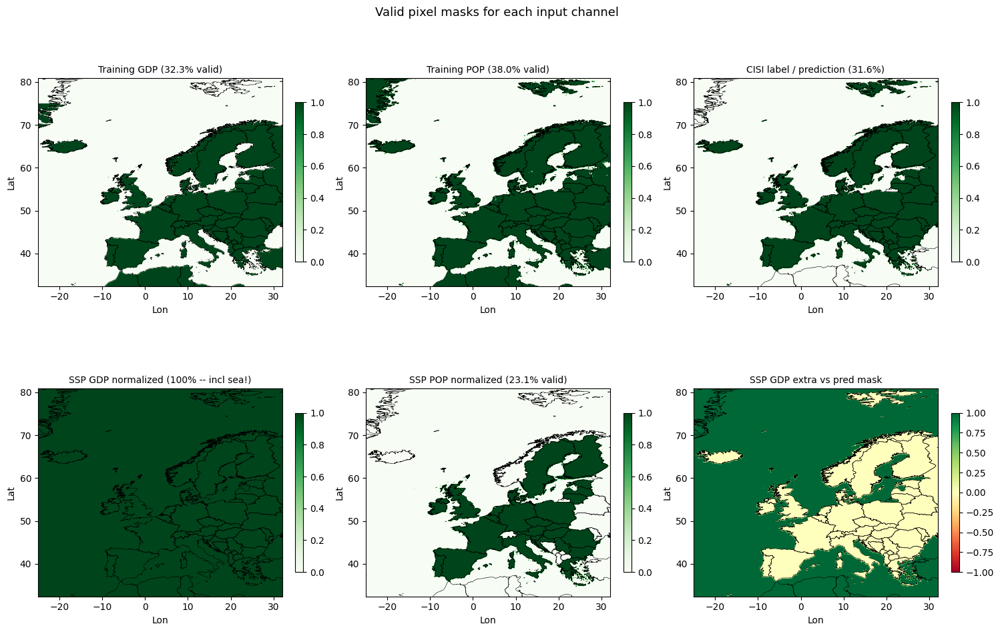

Saved input_masks.png


In [44]:
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
fig.suptitle('Valid pixel masks for each input channel', fontsize=13)
mask_panels = [
    ('Training GDP (32.3% valid)',           gdp_mask,     'Greens', 0, 1),
    ('Training POP (38.0% valid)',           pop_mask,     'Greens', 0, 1),
    ('CISI label / prediction (31.6%)',      cisi_mask,    'Greens', 0, 1),
    ('SSP GDP normalized (100% -- incl sea!)', gdp_ssp_mask, 'Greens', 0, 1),
    ('SSP POP normalized (23.1% valid)',     pop_ssp_mask, 'Greens', 0, 1),
    ('SSP GDP extra vs pred mask',           gdp_ssp_mask.astype(float) - cisi_mask.astype(float), 'RdYlGn', -1, 1),
]
for ax, (title, data, cmap, vmin, vmax) in zip(axes.flat, mask_panels):
    d = data.astype(float) if data.dtype == bool else data
    im = ax.imshow(d, cmap=cmap, vmin=vmin, vmax=vmax, extent=ext, origin='upper', aspect='auto')
    world.boundary.plot(ax=ax, linewidth=0.4, color='black')
    ax.set_xlim(ref_bounds.left, ref_bounds.right); ax.set_ylim(ref_bounds.bottom, ref_bounds.top)
    ax.set_title(title, fontsize=10); ax.set_xlabel('Lon'); ax.set_ylabel('Lat')
    plt.colorbar(im, ax=ax, fraction=0.03)
plt.tight_layout()
plt.savefig('figures/input_masks.png', dpi=150, bbox_inches='tight')
plt.show(); print('Saved input_masks.png')


### 3.3 Coverage summary table

In [45]:
print(('Mask').ljust(38), ('N pixels').rjust(10), ('% grid').rjust(8), ('% pred').rjust(10))
print('-' * 70)
entries = [
    ('Training GDP',                   gdp_mask),
    ('Training POP',                   pop_mask),
    ('CISI label (= prediction area)', cisi_mask),
    ('SSP GDP normalized',             gdp_ssp_mask),
    ('SSP POP normalized',             pop_ssp_mask),
    ('SSP GDP OUTSIDE pred area',      gdp_ssp_mask & ~cisi_mask),
    ('SSP POP MISSING inside pred',    ~pop_ssp_mask & cisi_mask),
]
for name, mask in entries:
    n        = int(mask.sum())
    pct_grid = round(float(mask.mean()) * 100, 1)
    pct_pred = round(int((mask & cisi_mask).sum()) / int(cisi_mask.sum()) * 100, 1)
    print(name.ljust(38), str(n).rjust(10), (str(pct_grid)+'%').rjust(8), (str(pct_pred)+'%').rjust(10))


Mask                                     N pixels   % grid     % pred
----------------------------------------------------------------------
Training GDP                                89397    32.3%      89.4%
Training POP                               104939    38.0%      98.9%
CISI label (= prediction area)              87346    31.6%     100.0%
SSP GDP normalized                         276450   100.0%     100.0%
SSP POP normalized                          63811    23.1%      71.1%
SSP GDP OUTSIDE pred area                  189104    68.4%       0.0%
SSP POP MISSING inside pred                 25270     9.1%      28.9%
